Parkinson’s Disease (PD) is a degenerative neurological disorder marked by decreased
dopamine levels in the brain. It manifests itself through a deterioration of movement, including
the presence of tremors and stiffness. There is commonly a marked effect on speech, including
dysarthria (difficulty articulating sounds), hypophonia (lowered volume), and monotone (reduced
pitch range). Additionally, cognitive impairments and changes in mood can occur, and risk of
dementia is increased.
Traditional diagnosis of Parkinson’s Disease involves a clinician taking a neurological history of
the patient and observing motor skills in various situations. Since there is no definitive
laboratory test to diagnose PD, diagnosis is often difficult, particularly in the early stages when
motor effects are not yet severe. Monitoring progression of the disease over time requires
repeated clinic visits by the patient. An effective screening process, particularly one that doesn’t
require a clinic visit, would be beneficial. Since PD patients exhibit characteristic vocal features,
voice recordings are a useful and non-invasive tool for diagnosis. If machine learning algorithms
could be applied to a voice recording dataset to accurately diagnosis PD, this would be an
effective screening step prior to an appointment with a clinician.
The data & attributes information for this project is available
at https://archive.ics.uci.edu/ml/machine-learning-databases/parkinsons/ The data consists of
those diagnosed with Parkinson Disease and those who do not.

In [1]:
import pandas as pd
import plotly.graph_objects as go
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score,confusion_matrix,f1_score

# <span style="font-family:  Lucida Calligraphy; font-size:1.2em;color:navy;">Load Data

In [2]:
df = pd.read_csv('parkinsons.data')

In [3]:
# for x in df.columns:
#     print("dict(label='"+x+"',values=df['"+x+"']),"")

In [4]:
print ("Rows     : " ,df.shape[0])
print ("Columns  : " ,df.shape[1])
print ("\nFeatures : \n" ,df.columns.tolist())
print ("\nMissing values :  ", df.isnull().sum().values.sum())
print ("\nUnique values :  \n",df.nunique())

Rows     :  195
Columns  :  24

Features : 
 ['name', 'MDVP:Fo(Hz)', 'MDVP:Fhi(Hz)', 'MDVP:Flo(Hz)', 'MDVP:Jitter(%)', 'MDVP:Jitter(Abs)', 'MDVP:RAP', 'MDVP:PPQ', 'Jitter:DDP', 'MDVP:Shimmer', 'MDVP:Shimmer(dB)', 'Shimmer:APQ3', 'Shimmer:APQ5', 'MDVP:APQ', 'Shimmer:DDA', 'NHR', 'HNR', 'status', 'RPDE', 'DFA', 'spread1', 'spread2', 'D2', 'PPE']

Missing values :   0

Unique values :  
 name                195
MDVP:Fo(Hz)         195
MDVP:Fhi(Hz)        195
MDVP:Flo(Hz)        195
MDVP:Jitter(%)      173
MDVP:Jitter(Abs)     19
MDVP:RAP            155
MDVP:PPQ            165
Jitter:DDP          180
MDVP:Shimmer        188
MDVP:Shimmer(dB)    149
Shimmer:APQ3        184
Shimmer:APQ5        189
MDVP:APQ            189
Shimmer:DDA         189
NHR                 185
HNR                 195
status                2
RPDE                195
DFA                 195
spread1             195
spread2             194
D2                  195
PPE                 195
dtype: int64


In [5]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
MDVP:Fo(Hz),195.0,154.228641,41.390065,88.333000,117.572000,148.790000,182.769000,260.105000
MDVP:Fhi(Hz),195.0,197.104918,91.491548,102.145000,134.862500,175.829000,224.205500,592.030000
MDVP:Flo(Hz),195.0,116.324631,43.521413,65.476000,84.291000,104.315000,140.018500,239.170000
MDVP:Jitter(%),195.0,0.006220,0.004848,0.001680,0.003460,0.004940,0.007365,0.033160
MDVP:Jitter(Abs),195.0,0.000044,0.000035,0.000007,0.000020,0.000030,0.000060,0.000260
MDVP:RAP,195.0,0.003306,0.002968,0.000680,0.001660,0.002500,0.003835,0.021440
MDVP:PPQ,195.0,0.003446,0.002759,0.000920,0.001860,0.002690,0.003955,0.019580
Jitter:DDP,195.0,0.009920,0.008903,0.002040,0.004985,0.007490,0.011505,0.064330
MDVP:Shimmer,195.0,0.029709,0.018857,0.009540,0.016505,0.022970,0.037885,0.119080
MDVP:Shimmer(dB),195.0,0.282251,0.194877,0.085000,0.148500,0.221000,0.350000,1.302000


## <span style="font-family: Lucida Calligraphy; font-size:1.2em;color:green;"> Insights: 
    All the variables are numeric of nature.
    There are skewed variables too.

# <span style="font-family:  Lucida Calligraphy; font-size:1.2em;color:navy;">Data Manipulation

not much to manipulate it

# <span style="font-family:  Lucida Calligraphy; font-size:1.2em;color:navy;">Visualization

Imported AutoViz_Class version: 0.0.68. Call using: 
    from autoviz.AutoViz_Class import AutoViz_Class
    AV = AutoViz_Class()
    AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=0,
                            lowess=False,chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30)
            
To remove previous versions, perform 'pip uninstall autoviz'
Shape of your Data Set: (195, 24)
Classifying variables in data set...
    23 Predictors classified...
        This does not include the Target column(s)
    1 variables removed since they were ID or low-information variables
    List of variables removed: ['name']
Total Number of Scatter Plots = 231
Number of Cat and Continuous Vars exceeds 30, hence no Pivot or Bar Charts
Time to run AutoViz (in seconds) = 59.464


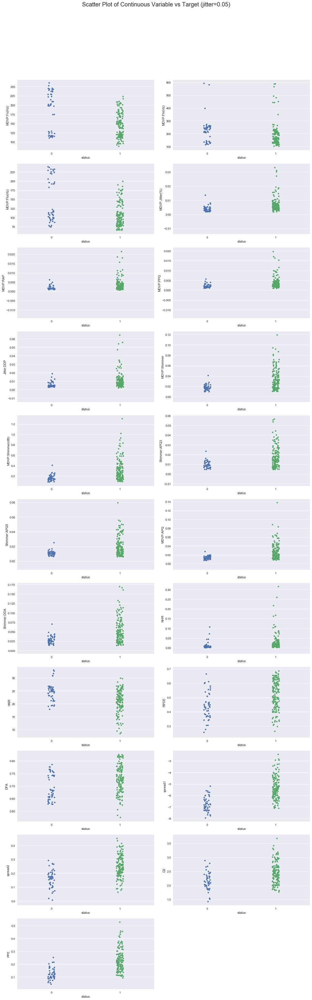

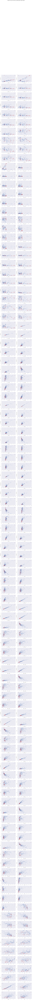

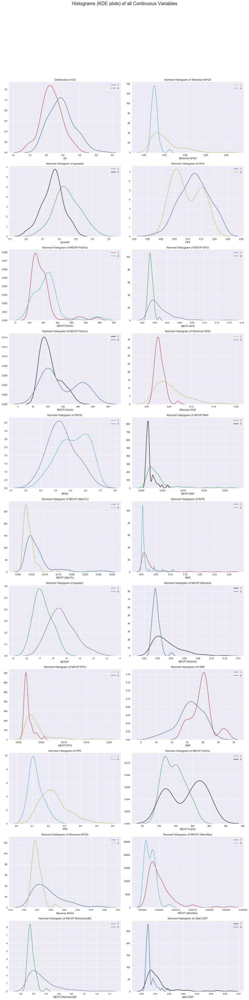

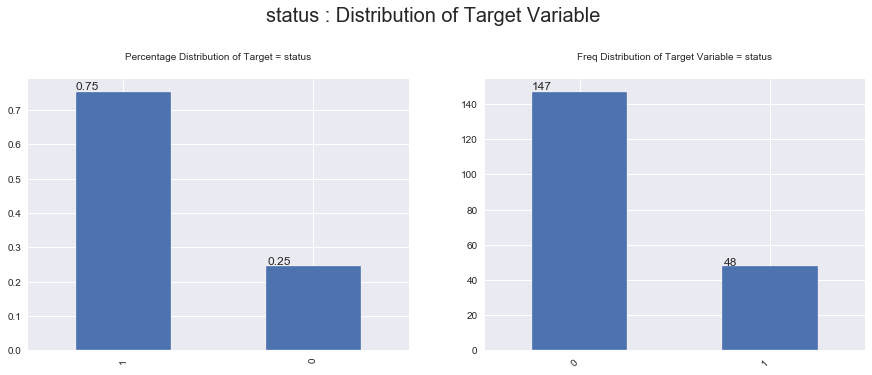

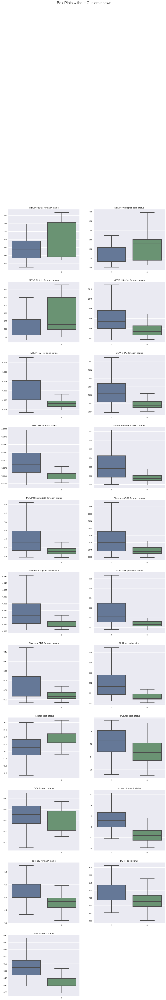

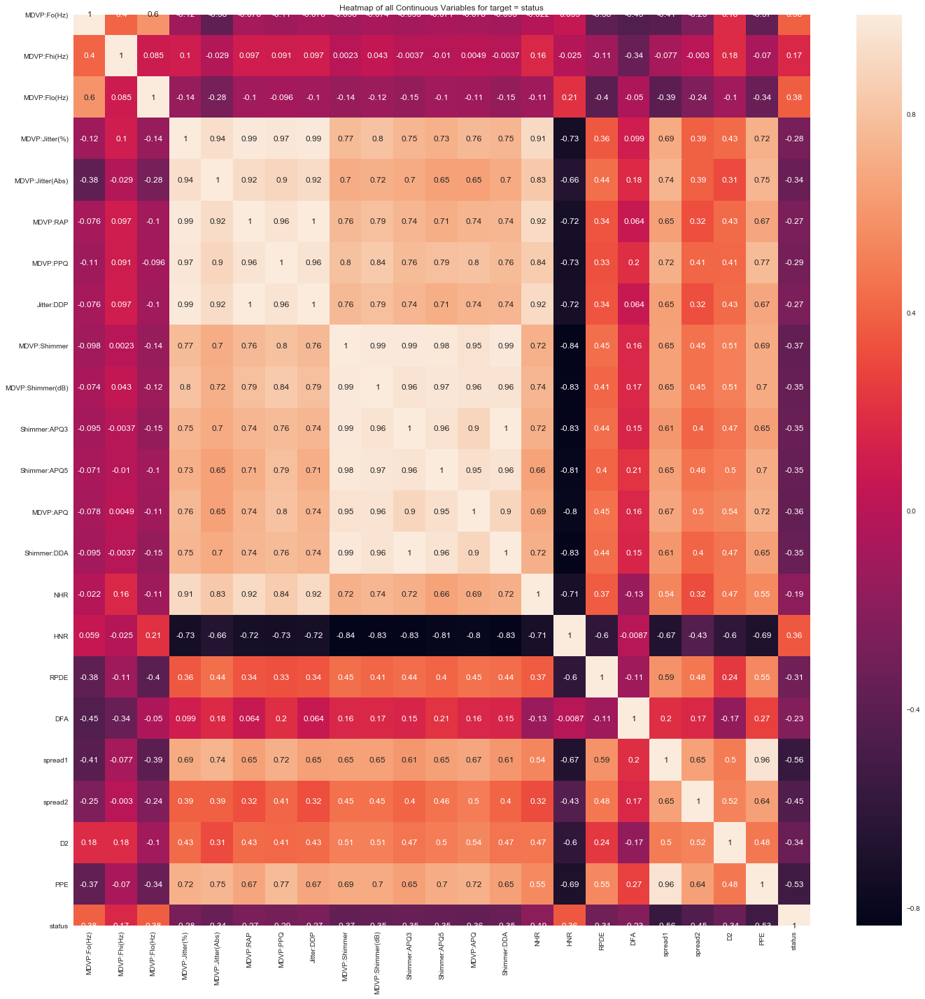

In [6]:
from autoviz.AutoViz_Class import AutoViz_Class

AV = AutoViz_Class()
filename = ""
sep = ","
dft = AV.AutoViz(
    filename,
    sep,
    'status',
    df,
    header=0,
    verbose=2,
    lowess=False,
    chart_format="svg",
    max_rows_analyzed=150000,
    max_cols_analyzed=30,
)

## <span style="font-family: Lucida Calligraphy; font-size:1.2em;color:green;"> Insights: 


(one) - Parkinson's, (zero) - healthy

### <span style="font-family: Lucida Calligraphy; font-size:1.2em;color:green;"> Jitter plots:
1.vocal fundamental frequency : there seems to be 2 clusters on healthy people, and people with Parkinson's have continuous trend

2.variation in fundamental frequency: healthy people has limited range on these Parameters and other category has long skews

3.variation in amplitude: healthy people has limited range on these Parameters and other category has long skews

4.ratio of noise to tonal components in the voice: NHR on healthy people has lower values and HNR has higher values, with people with parkinsons, its completely spread

5.Two nonlinear dynamical complexity measures: nothing much difference

6.3 nonlinear measures of fundamental frequency variation: healthy people have limited range and parkinsons ppl have large ranges

### <span style="font-family: Lucida Calligraphy; font-size:1.2em;color:green;"> Scatter plots:

1.vocal fundamental frequency : linear trend is observed

2.variation in fundamental frequency: linear trend is observed

3.variation in amplitude: linear trend is observed

4.ratio of noise to tonal components in the voice: full on clouds observed, not a linear trend

5.Two nonlinear dynamical complexity measures: full on clouds observed, not a linear trend

6.3 nonlinear measures of fundamental frequency variation: full on clouds observed, not a linear trend

### <span style="font-family: Lucida Calligraphy; font-size:1.2em;color:green;"> KDE plots:

1.vocal fundamental frequency : People with healthy have higher peaks and  Parkinson's  people have spread of frequency, 
also healthy people have 2 peaks which could indicate 2 clusters

2.variation in fundamental frequency: healthy people has limited range on these Parameters and other category has long skews, and healthy people have very high peaks and others dont

3.variation in amplitude: healthy people has limited range on these Parameters and other category has long skews

4.ratio of noise to tonal components in the voice: NHR on healthy people has very high peak and HNR has high values, with people with parkinsons, its completely spread and the value is low

5.Two nonlinear dynamical complexity measures: nothing much difference but peaks are a bit high on healthy people

6.3 nonlinear measures of fundamental frequency variation: nothing much difference but peaks are a bit high on healthy people

### <span style="font-family: Lucida Calligraphy; font-size:1.2em;color:green;"> Target Distribution:

In the dataset, healthy ppl make upto 25% 

### <span style="font-family: Lucida Calligraphy; font-size:1.2em;color:green;"> Box plots:

1.vocal fundamental frequency : People with healthy have higher median values and  Parkinson's  people have spread of IQR

2.variation in fundamental frequency: healthy people has limited IQR on these Parameters and other category has long IQR, and healthy people have low median than others

3.variation in amplitude: healthy people has limited IQR on these Parameters and other category has long IQR with higher median values than healthy ppl

4.ratio of noise to tonal components in the voice: NHR on healthy people has low IQR and lower median and HNR has low IQR and Median is higher, with people with parkinsons, its completely opposite

5.Two nonlinear dynamical complexity measures: healthy ppl has lower median vlaue and Parkinson's has higher median values

6.3 nonlinear measures of fundamental frequency variation: medial values are lower for healthy ppl and Q3 is lesser than Q1 of parkingsons people

# <span style="font-family:  Lucida Calligraphy; font-size:1.2em;color:navy;">Preprocessing

In [7]:
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler

#customer id col
Id_col     = ['name']
#Target columns
target_col = ["status"]
#categorical columns
cat_cols   = df.nunique()[df.nunique() < 6].keys().tolist()
cat_cols   = [x for x in cat_cols if x not in target_col]
#numerical columns
num_cols   = [x for x in df.columns if x not in cat_cols + target_col + Id_col]
#Binary columns with 2 values
bin_cols   = df.nunique()[df.nunique() == 2].keys().tolist()
#Columns more than 2 values
multi_cols = [i for i in cat_cols if i not in bin_cols]

#Label encoding Binary columns
le = LabelEncoder()
for i in bin_cols :
    df[i] = le.fit_transform(df[i])
    
#Duplicating columns for multi value columns
df = pd.get_dummies(data = df,columns = multi_cols )

#Scaling Numerical columns
std = StandardScaler()
scaled = std.fit_transform(df[num_cols])
scaled = pd.DataFrame(scaled,columns=num_cols)

#dropping original values merging scaled values for numerical columns
df_df_og = df.copy()
df = df.drop(columns = num_cols,axis = 1)
df = df.merge(scaled,left_index=True,right_index=True,how = "left")


In [8]:
df_actual=df.copy()
df.drop(labels='status',axis=1,inplace=True)
df.drop(labels='name',axis=1,inplace=True)
df_actual.drop(labels='name',axis=1,inplace=True)


# <span style="font-family:  Lucida Calligraphy; font-size:1.2em;color:navy;">Feature Engineering

In [9]:

# we can add the label from kmeans clustering to find groups within and can be used as a feature
from sklearn.cluster import KMeans
from sklearn import metrics
from sklearn.metrics import r2_score
cluster_range = range( 2, 10)   # expect 3 to four clusters from the pair panel visual inspection hence restricting from 2 to 6
cluster_errors = []
cluster_sil_scores_euc = []

for num_clusters in cluster_range:
    clusters = KMeans( num_clusters, n_init = 15,random_state=1)
    clusters.fit(df)
    labels = clusters.labels_                     # capture the cluster lables
    centroids = clusters.cluster_centers_         # capture the centroids
    cluster_errors.append( clusters.inertia_ )    # capture the intertia
    cluster_sil_scores_euc.append(metrics.silhouette_score(df, labels, metric='euclidean'))
    
    # combine the cluster_range and cluster_errors into a dataframe by combining them
clusters_df = pd.DataFrame( { "num_clusters":cluster_range, "cluster_errors": cluster_errors , "sil_score": cluster_sil_scores_euc  } )
clusters_df[0:15]

,num_clusters,cluster_errors,sil_score
0,2,2817.156835,0.437339
1,3,2076.204848,0.276330
2,4,1822.347974,0.237332
3,5,1595.341907,0.204939
4,6,1441.814552,0.215240
5,7,1307.176000,0.222051
6,8,1231.747304,0.215361
7,9,1167.782704,0.221019


In [10]:
trace1 = {
  "type": "scatter", 
  "x": clusters_df.num_clusters, 
  "y": clusters_df.cluster_errors
}
layout = {
  "title": "Elbow Plot for Errors", 
  "xaxis": {"title": "k Value"}, 
  "yaxis": {"title": "SSE"}
}
fig = go.Figure(trace1, layout=layout)
fig.show()

In [11]:
trace1 = {
  "type": "scatter", 
  "x": clusters_df.num_clusters, 
  "y": clusters_df.sil_score
}

layout = {
  "title": "Elbow Plot for SIL scores", 
  "xaxis": {"title": "k Value"}, 
  "yaxis": {"title": "sil_score"}
}
fig = go.Figure([trace1], layout=layout)
fig.show()

In [12]:
# k=2 seems to be a good option
KMeans_2 = df.copy()
cluster = KMeans(n_clusters=2, random_state=1)
cluster.fit(KMeans_2)
print('SIL score for this model is ')
print((metrics.silhouette_score(KMeans_2, labels, metric='euclidean')))
centroids = cluster.cluster_centers_
centroid_df = pd.DataFrame(centroids, columns=list(KMeans_2))
prediction = cluster.predict(KMeans_2)
KMeans_2["Label"] = prediction
KMeans_2.groupby("Label").count()

SIL score for this model is 
0.22101894460812824


,MDVP:Fo(Hz),MDVP:Fhi(Hz),MDVP:Flo(Hz),MDVP:Jitter(%),MDVP:Jitter(Abs),MDVP:RAP,MDVP:PPQ,Jitter:DDP,MDVP:Shimmer,MDVP:Shimmer(dB),...,MDVP:APQ,Shimmer:DDA,NHR,HNR,RPDE,DFA,spread1,spread2,D2,PPE
Label,,,,,,,,,,,,,,,,,,,,,
0,165,165,165,165,165,165,165,165,165,165,...,165,165,165,165,165,165,165,165,165,165
1,30,30,30,30,30,30,30,30,30,30,...,30,30,30,30,30,30,30,30,30,30


In [13]:
for x in KMeans_2.columns:
    if x != 'Label':
        KMeans_2.drop(labels=x,inplace=True,axis=1)

In [14]:

df = df_actual.merge(KMeans_2, left_index=True, right_index=True, how="inner")
df

,status,MDVP:Fo(Hz),MDVP:Fhi(Hz),MDVP:Flo(Hz),MDVP:Jitter(%),MDVP:Jitter(Abs),MDVP:RAP,MDVP:PPQ,Jitter:DDP,MDVP:Shimmer,...,Shimmer:DDA,NHR,HNR,RPDE,DFA,spread1,spread2,D2,PPE,Label
0,1,-0.829300,-0.436165,-0.952037,0.334914,0.749759,0.132963,0.760800,0.131755,0.745985,...,0.607532,-0.067893,-0.193225,-0.807838,1.760814,0.801323,0.480477,-0.210531,0.868886,0
1,1,-0.770972,-0.530974,-0.057721,0.715418,1.037674,0.453892,1.276809,0.452684,1.681731,...,1.548254,-0.137843,-0.634508,-0.387524,1.837562,1.479853,1.311185,0.275077,1.803605,1
2,1,-0.909476,-0.723168,-0.109875,0.884991,1.325589,0.720770,1.585687,0.721813,1.202693,...,1.175323,-0.291633,-0.279760,-0.662075,1.942048,1.141445,1.017682,-0.103629,1.402661,1
3,1,-0.909622,-0.649092,-0.114229,0.775389,1.325589,0.578885,1.284076,0.577677,1.340396,...,1.340229,-0.280719,-0.281346,-0.613134,1.832380,1.440945,1.293840,0.062145,1.806954,1
4,1,-0.925657,-0.606245,-0.130608,1.368893,1.901418,1.095750,2.047187,1.096793,1.836448,...,1.899461,-0.178026,-0.506745,-0.783021,1.909364,1.780940,0.096195,-0.130026,2.267082,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
190,0,0.483467,0.371185,-0.508265,-0.337173,-0.401899,-0.228505,-0.311189,-0.227459,0.593395,...,0.759930,0.069278,-0.536647,-0.483208,-1.090704,-0.785527,-1.256837,0.721944,-0.817703,0
191,0,1.339202,0.612690,-0.618218,-0.120037,-0.401899,0.001213,-0.191272,0.002258,-0.116922,...,0.037108,-0.167360,-0.620463,-0.644916,-0.631503,-0.469859,-1.168475,1.054135,-0.418929,0
192,0,0.495578,0.470104,-0.968393,1.526058,1.037674,0.991026,0.797139,0.992069,-0.352453,...,-0.294679,2.041513,-0.906799,-0.877441,-1.130853,-1.014154,-0.818079,0.780338,-0.832410,0
193,0,1.078761,2.190044,-0.954180,0.243924,-0.113985,0.132963,0.164847,0.131755,-0.358834,...,-0.297970,1.175327,-0.649233,-0.456374,-1.343323,-0.974960,-0.229066,-0.637003,-0.926105,0


# <span style="font-family:  Lucida Calligraphy; font-size:1.2em;color:navy;">Test Train Split

In [15]:
# test train split
X=df.drop(labels='status',axis=1)
y=df['status']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=1)


In [16]:
print ("Columns  : " ,X.shape[1])

Columns  :  23


# <span style="font-family:  Lucida Calligraphy; font-size:1.2em;color:navy;">Decision Tree

In [17]:
dtc=DecisionTreeClassifier(criterion='entropy',random_state=0)
dtc.fit(X_train,y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=0, splitter='best')

In [18]:
y_pred=dtc.predict(X_test)
print('test accuracy of the model is : ',accuracy_score(y_test,y_pred))
y_pred_train=dtc.predict(X_train)
print('train accuracy of the model is : ',accuracy_score(y_train,y_pred_train))

test accuracy of the model is :  0.8983050847457628
train accuracy of the model is :  1.0


In [19]:
print('cross tab of the model is : ')
pd.crosstab(y_test, y_pred,margins=True)

cross tab of the model is : 


col_0,0,1,All
status,,,
0,14,5,19
1,1,39,40
All,15,44,59


In [20]:
import plotly.express as px
coefficients = pd.DataFrame(dtc.feature_importances_)
cols=X.columns
column_df = pd.DataFrame(cols)
coef_sumry = (pd.merge(coefficients, column_df, left_index=True,
                       right_index=True, how="left"))
coef_sumry.columns = ["coefficients", "features"]
coef_sumry = coef_sumry.sort_values(by="coefficients", ascending=False)
px.bar(y=coef_sumry['coefficients'],x=coef_sumry['features'])
# coef_sumry

# <span style="font-family:  Lucida Calligraphy; font-size:1.2em;color:navy;">Regularization

In [21]:
dtc=DecisionTreeClassifier(criterion='entropy',random_state=0,max_depth=2,min_samples_leaf=2)
dtc.fit(X_train,y_train)
y_pred=dtc.predict(X_test)
print('test accuracy of the model is : ',accuracy_score(y_test,y_pred))
y_pred_train=dtc.predict(X_train)
print('train accuracy of the model is : ',accuracy_score(y_train,y_pred_train))

test accuracy of the model is :  0.7966101694915254
train accuracy of the model is :  0.8970588235294118


After regularization, its observed that train accuracy reduced. 

thats a good sign, due to which the model is generalize better.

In [22]:

import plotly.express as px
coefficients = pd.DataFrame(dtc.feature_importances_)
cols=X.columns
column_df = pd.DataFrame(cols)
coef_sumry = (pd.merge(coefficients, column_df, left_index=True,
                       right_index=True, how="left"))
coef_sumry.columns = ["coefficients", "features"]
coef_sumry = coef_sumry.sort_values(by="coefficients", ascending=False)
px.bar(y=coef_sumry['coefficients'],x=coef_sumry['features'])
# coef_sumryabs

## <span style="font-family: Lucida Calligraphy; font-size:1.2em;color:green;"> Insights: 
1. Accuray scores imporoved a bit and feature importances changed

# <span style="font-family:  Lucida Calligraphy; font-size:1.2em;color:navy;">Random Forest

In [23]:
from sklearn.ensemble import RandomForestClassifier
rf=RandomForestClassifier(n_estimators=100)
rf.fit(X_train,y_train)
y_pred=dtc.predict(X_test)
print('test accuracy of the model is : ',accuracy_score(y_test,y_pred))
y_pred_train=dtc.predict(X_train)
print('train accuracy of the model is : ',accuracy_score(y_train,y_pred_train))

test accuracy of the model is :  0.7966101694915254
train accuracy of the model is :  0.8970588235294118


In [24]:
#getting best number of tree
for k in [1,10,50,100,250,400,500,1000]:
    print('numbers of trees are: ',k)
    rf=RandomForestClassifier(n_estimators=k,random_state=20,max_depth=2,min_samples_leaf=2)
    rf.fit(X_train,y_train)
    y_pred=dtc.predict(X_test)
    print('test accuracy of the model is : ',accuracy_score(y_test,y_pred))
    y_pred_train=dtc.predict(X_train)
    print('train accuracy of the model is : ',accuracy_score(y_train,y_pred_train))

numbers of trees are:  1
test accuracy of the model is :  0.7966101694915254
train accuracy of the model is :  0.8970588235294118
numbers of trees are:  10
test accuracy of the model is :  0.7966101694915254
train accuracy of the model is :  0.8970588235294118
numbers of trees are:  50
test accuracy of the model is :  0.7966101694915254
train accuracy of the model is :  0.8970588235294118
numbers of trees are:  100
test accuracy of the model is :  0.7966101694915254
train accuracy of the model is :  0.8970588235294118
numbers of trees are:  250
test accuracy of the model is :  0.7966101694915254
train accuracy of the model is :  0.8970588235294118
numbers of trees are:  400
test accuracy of the model is :  0.7966101694915254
train accuracy of the model is :  0.8970588235294118
numbers of trees are:  500
test accuracy of the model is :  0.7966101694915254
train accuracy of the model is :  0.8970588235294118
numbers of trees are:  1000
test accuracy of the model is :  0.7966101694915254


## <span style="font-family: Lucida Calligraphy; font-size:1.2em;color:green;"> Insights: 
the model is not improving on anything based on number of tress, this is due to less data points